#Entrenamiento Deteccion de Objectos


### Montar carpeta google drive

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


Creamos 2 carpetas en una carpeta de modelo_entrenar:
- datos
- entrenamiento

In [ ]:
import os
%cd /content/gdrive/MyDrive/
!mkdir modelo_entrenar
%cd /content/gdrive/MyDrive/modelo_entrenar
!mkdir datos entrenamiento

/content/gdrive/MyDrive
/content/gdrive/MyDrive/modelo_entrenar


## 1. Instalacion de librerias estables y API deteccion de objetos

Librerias para deteccion de objetos 

In [ ]:
!pip install tensorflow==2.8
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2
!pip uninstall opencv-python --y
!pip uninstall opencv-contrib-python --y
!pip uninstall opencv-python-headless --y
!pip install opencv-python==4.5.4.60
!pip install opencv-contrib-python==4.5.4.60
!pip install opencv-python-headless==4.5.4.60

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 668.3 MB 18 kB/s 
     |████████████████████████████████| 462 kB 34.1 MB/s 
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.2+zzzcolab20220719082949
    Uninstalling tensorflow-2.8.2+zzzcolab20220719082949:
      Successfully uninstalled tensorflow-2.8.2+zzzcolab20220719082949
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following packages will be REMOVED:
  libcudnn8-dev
The following held packages will be changed:
  libcudnn8
The following packages will be upgraded:
  libcudnn8
1 upgraded, 0 newly installed, 1 to remove and 17 not upgraded.
Need to get 430 MB of archives.
After this operation, 3,139 MB disk space will be freed

Instalacion de API de tensorflow

In [ ]:
%cd  /content/
import os
import pathlib

# Clonamos del repositorio
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models



/content
Cloning into 'models'...
remote: Enumerating objects: 3442, done.
remote: Counting objects: 100% (3442/3442), done.
remote: Compressing objects: 100% (2885/2885), done.
remote: Total 3442 (delta 894), reused 1468 (delta 500), pack-reused 0
Receiving objects: 100% (3442/3442), 43.71 MiB | 17.04 MiB/s, done.
Resolving deltas: 100% (894/894), done.


In [ ]:
# Instalacion de API deteccion de objetos
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1694955 sha256=a4d104aeecd034d56f42b73d6b63a06dfe50f8b9128383fe1c5e8953ef081d03
  Stored in directory: /tmp/pip-ephem-wheel-cache-ftxg0fy2/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22257 sha256=342aa9ea21833d8911c54479994949db72bdb6bbac5083cfa1ba5526b56817c1
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78544 sha256=df77db4b403d909ac26a3721f18933062bd4b53e9d87080b3c9e94d03f4b8d27
  Stored in directory: /root/.cache/pip/wheels/a4/61/fd/c57e374e580aa78a45ed78d5859b3a44436af17e22ca53284f
  Created wheel for avro-python3: filename=avro_p

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.1.0 which is incompatible.


## 2. Datos para Entrenamiento

Subimos los archivos .zip de las imagenes y anotaciones

In [ ]:
%cd /content/gdrive/MyDrive/modelo_entrenar/datos

!unzip /content/gdrive/MyDrive/modelo_entrenar/datos/Imagenes.zip -d .
!unzip /content/gdrive/MyDrive/modelo_entrenar/datos/Anotaciones.zip -d .

/content/gdrive/MyDrive/modelo_entrenar/datos
Archive:  /content/gdrive/MyDrive/modelo_entrenar/datos/Imagenes.zip
  inflating: ./Imagenes/croped12_231240.jpg  
  inflating: ./Imagenes/croped12_231350.jpg  
  inflating: ./Imagenes/croped12_231359.jpg  
  inflating: ./Imagenes/croped12_231403.jpg  
  inflating: ./Imagenes/croped12_231409.jpg  
  inflating: ./Imagenes/croped12_231423.jpg  
  inflating: ./Imagenes/croped12_231428.jpg  
  inflating: ./Imagenes/croped12_231432.jpg  
  inflating: ./Imagenes/croped12_231442.jpg  
  inflating: ./Imagenes/croped12_231512.jpg  
  inflating: ./Imagenes/croped12_231514.jpg  
  inflating: ./Imagenes/croped12_231516.jpg  
  inflating: ./Imagenes/croped12_231524.jpg  
  inflating: ./Imagenes/croped12_231528.jpg  
  inflating: ./Imagenes/croped12_231532.jpg  
  inflating: ./Imagenes/croped12_231539.jpg  
  inflating: ./Imagenes/croped12_231543.jpg  
  inflating: ./Imagenes/croped12_231547.jpg  
  inflating: ./Imagenes/croped12_231558.jpg  
  inflating

Creamos las carpetas de train y validation

In [ ]:
%cd /content/gdrive/MyDrive/modelo_entrenar/datos
!mkdir etiquetas_train etiquetas_validation

/content/gdrive/MyDrive/modelo_entrenar/datos


Division de datos de train y validation 80% y 20%

In [ ]:
DIR = '/content/gdrive/MyDrive/modelo_entrenar/datos/Anotaciones' 
numero_datos = len([name for name in os.listdir(DIR) if os.path.isfile(os.path.join(DIR, name))])
datos_validacion = int(numero_datos*0.20)
print('numero de datos de validacion: '+str(datos_validacion))

numero de datos de validacion: 64


Dividimos de forma aleatoria con el numero de validacion

In [ ]:
# cambiamos el valor anterior aqui:
!ls Anotaciones/* | sort -R | head -64| xargs -I{} mv {} etiquetas_validation/
!ls Anotaciones/* | xargs -I{} mv {} etiquetas_train/

Creamos los archivos CSV y mapa de etiqueta .pbtxt

In [ ]:
%cd  /content/gdrive/MyDrive/modelo_entrenar/datos


import glob
import xml.etree.ElementTree as ET
import pandas as pd


def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text)
      value = (root.find('filename').text  ,   
               int(root.find('size')[0].text),
               int(root.find('size')[1].text),
               member[0].text,
               int(member[4][0].text),
               int(member[4][1].text),
               int(member[4][2].text),
               int(member[4][3].text))
      xml_list.append(value)
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name) 
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

for label_path in ['etiquetas_train', 'etiquetas_validation']:
  image_path = os.path.join(os.getcwd(), label_path)
  xml_df, classes = xml_to_csv(label_path)
  xml_df.to_csv(f'{label_path}.csv', index=None)
  print(f'Se convirtio los datos {label_path} xml to csv.')

label_map_path = os.path.join("label_map.pbtxt")
pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)
    print('Se creo el mapa de etiquetas label_map.pbtxt ')  

/content/gdrive/MyDrive/modelo_entrenar/datos
Se convirtio los datos etiquetas_train xml to csv.
Se convirtio los datos etiquetas_validation xml to csv.
Se creo el mapa de etiquetas label_map.pbtxt 


Con el archivo subido para generar los archivos tfrecord

In [ ]:
!python /content/gdrive/MyDrive/modelo_entrenar/datos/generate_tfrecord.py \
        /content/gdrive/MyDrive/modelo_entrenar/datos/etiquetas_train.csv  \
        /content/gdrive/MyDrive/modelo_entrenar/datos/label_map.pbtxt      \
        /content/gdrive/MyDrive/modelo_entrenar/datos/Imagenes             \
        /content/gdrive/MyDrive/modelo_entrenar/datos/train.record

!python /content/gdrive/MyDrive/modelo_entrenar/datos/generate_tfrecord.py     \
        /content/gdrive/MyDrive/modelo_entrenar/datos/etiquetas_validation.csv \
        /content/gdrive/MyDrive/modelo_entrenar/datos/label_map.pbtxt          \
        /content/gdrive/MyDrive/modelo_entrenar/datos/Imagenes                 \
        /content/gdrive/MyDrive/modelo_entrenar/datos/validation.record  

groups: 100% 259/259 [00:01<00:00, 195.24it/s]
Successfully created the TFRecords: /content/gdrive/MyDrive/modelo_entrenar/datos/train.record
groups: 100% 64/64 [00:00<00:00, 229.64it/s]
Successfully created the TFRecords: /content/gdrive/MyDrive/modelo_entrenar/datos/validation.record


## 3. Entrenamiento

Modelos de pre-entrenamientos:
https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

Creamos la carpeta para el modelo pre entrenado

In [ ]:
%cd /content/gdrive/MyDrive/modelo_entrenar/datos
!mkdir pre_modelo

/content/gdrive/MyDrive/modelo_entrenar/datos


Descargamos el modelo

In [ ]:
%cd /content/gdrive/MyDrive/modelo_entrenar/datos/pre_modelo

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!tar -xzvf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz

/content/gdrive/MyDrive/modelo_entrenar/datos/pre_modelo
--2022-08-08 15:46:10--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.130.128, 2404:6800:4003:c06::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.130.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  32.8MB/s    in 0.6s    

2022-08-08 15:46:11 (32.8 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoin

### Configuracion del entrenamiento a traves de archivo pipeline.config

In [ ]:
pipeline_file = '/content/gdrive/MyDrive/modelo_entrenar/datos/pipeline_nuevo.config'

model_dir = '/content/gdrive/MyDrive/modelo_entrenar/entrenamiento'

### Entrenamiento del modelo

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --num_train_steps=5000

2022-08-08 15:49:11.499583: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0808 15:49:11.505936 140481090717568 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 5000
I0808 15:49:11.513702 140481090717568 config_util.py:552] Maybe overwriting train_steps: 5000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0808 15:49:11.513875 140481090717568 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0808 15:49:11.539868 140481090717568 deprecation.py:356] From /usr/local/lib/python3.7/dist-packages/object_detection/model_lib_v2.py:564: StrategyBase.experimental

Evaluacion del modelo


In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir}\
    --alsologtostderr

W0808 16:12:31.927227 139774283638656 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0808 16:12:31.927473 139774283638656 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0808 16:12:31.927561 139774283638656 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0808 16:12:31.927652 139774283638656 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0808 16:12:31.927766 139774283638656 model_lib_v2.py:1110] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2022-08-08 16:12:34.233211: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config 

Vizualizar el entrenmiento del modelo

In [ ]:
%load_ext tensorboard         
%tensorboard --logdir '/content/gdrive/MyDrive/modelo_entrenar/entrenamiento'

<IPython.core.display.Javascript object>

Exportacion del modelo

In [ ]:
#carpeta para guardar el modelo
%cd /content/gdrive/MyDrive/modelo_entrenar/datos
!mkdir fine_tuned_model


/content/gdrive/MyDrive/modelo_entrenar/datos


In [ ]:
import re
import numpy as np

output_directory = '/content/gdrive/MyDrive/modelo_entrenar/datos/fine_tuned_model'
pipeline_file = '/content/gdrive/MyDrive/modelo_entrenar/datos/pipeline_nuevo.config'
last_model_path = '/content/gdrive/MyDrive/modelo_entrenar/entrenamiento'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

2022-08-08 16:16:52.118450: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0808 16:16:52.267225 140583869384576 deprecation.py:628] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:458: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0808 16:17:11.325205 1405838693845

### Ver la inferencia del modelo con una imagen

Cargar el modelo

In [ ]:
%cd /content/models/research/object_detection


import tensorflow as tf
import time
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

IMAGE_SIZE = (12, 8) # tamano
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/content/gdrive/MyDrive/modelo_entrenar/datos/fine_tuned_model/saved_model/"
print('Cargando el modelo...', end='')


detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print(' Listo!')

/content/models/research/object_detection
Cargando el modelo... Listo!


Inferencia del modelo

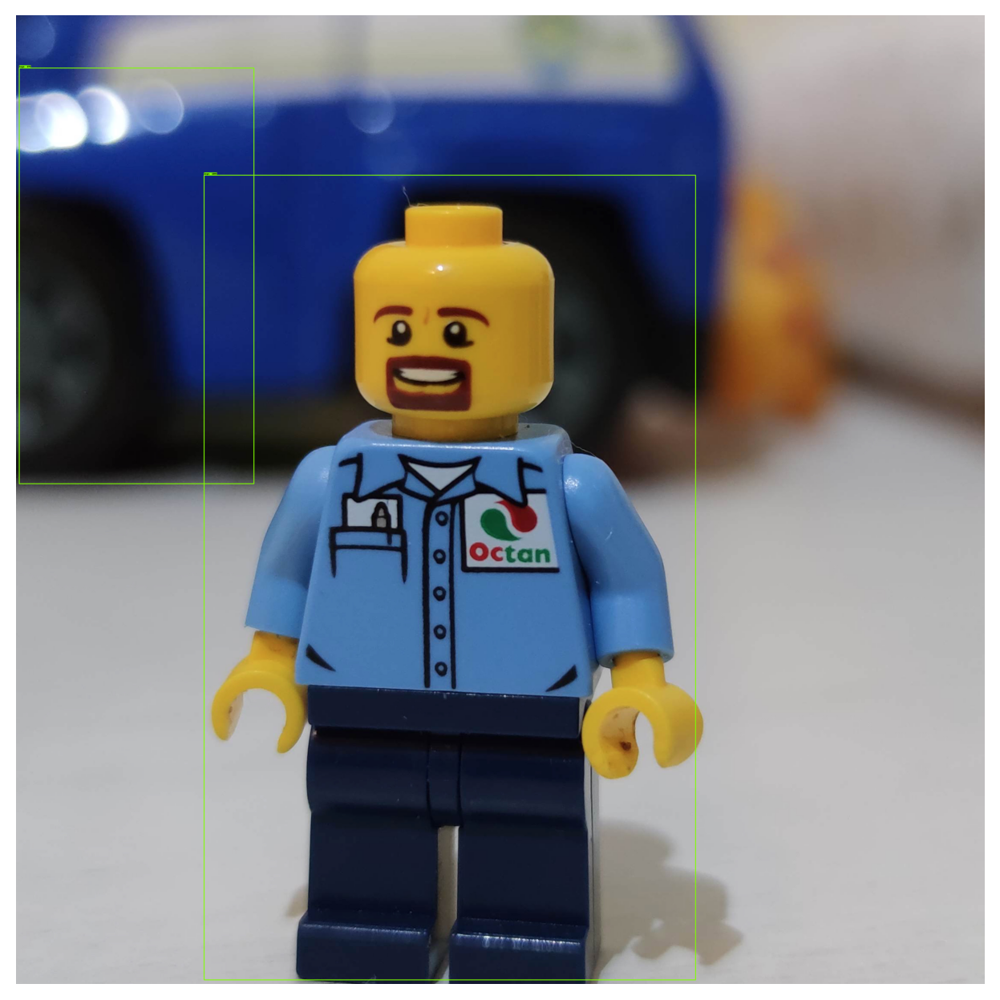

In [ ]:
import numpy as np

category_index=label_map_util.create_category_index_from_labelmap("/content/gdrive/MyDrive/modelo_entrenar/datos/label_map.pbtxt",use_display_name=True)

def load_image_into_numpy_array(path):

    return np.array(Image.open(path))

image_path = "/content/gdrive/MyDrive/modelo_entrenar/datos/Imagenes/croped12_231359.jpg"


image_np = load_image_into_numpy_array(image_path)
input_tensor = tf.convert_to_tensor(image_np)
input_tensor = input_tensor[tf.newaxis, ...]

detections = detect_fn(input_tensor)


num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections


detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.1, #umbral 
      agnostic_mode=False)
%matplotlib inline
plt.figure(figsize=IMAGE_SIZE, dpi=200)
plt.axis("off")
plt.imshow(image_np_with_detections)
plt.show()

## 4. Tensorflow LITE

In [ ]:
!pip install tf-nightly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 581.4 MB 7.5 kB/s 
     |████████████████████████████████| 439 kB 20.9 MB/s 
     |████████████████████████████████| 1.7 MB 55.7 MB/s 
     |████████████████████████████████| 5.9 MB 39.7 MB/s 
  Attempting uninstall: tf-estimator-nightly
    Found existing installation: tf-estimator-nightly 2.8.0.dev2021122109
    Uninstalling tf-estimator-nightly-2.8.0.dev2021122109:
      Successfully uninstalled tf-estimator-nightly-2.8.0.dev2021122109
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 1.12
    Uninstalling flatbuffers-1.12:
      Successfully uninstalled flatbuffers-1.12
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.9.1 requires flatbuffers<2,>=1.12, but you have flatbuffers 2

Exportar el modelo

In [ ]:
!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
--pipeline_config_path /content/gdrive/MyDrive/modelo_entrenar/datos/pipeline_nuevo.config \
--trained_checkpoint_dir /content/gdrive/MyDrive/modelo_entrenar/entrenamiento \
--output_directory /content/gdrive/MyDrive/modelo_entrenar/datos/tflite

2022-08-08 16:21:27.581692: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-08-08 16:21:28.526300: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-08-08 16:21:28.527151: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-08-08 16:21:28.527177: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some Tenso

Guardar en punto flotante 32

In [ ]:
%cd /content/gdrive/MyDrive/modelo_entrenar/datos

import tensorflow as tf

saved_model_dir = '/content/gdrive/MyDrive/modelo_entrenar/datos/tflite/saved_model'

converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
tflite_model = converter.convert()
open("/content/gdrive/MyDrive/modelo_entrenar/datos/tflite/model_fp32.tflite", "wb").write(tflite_model)

/content/gdrive/MyDrive/modelo_entrenar/datos


11497428

Reduccion del modelo
- Size reduction: up to 50 %
- Latency reduction: 2x
- Accuracy: Insignificant loss accuracy

In [ ]:
import tensorflow as tf
import numpy as np


saved_model_dir = '/content/gdrive/MyDrive/modelo_entrenar/datos/tflite/saved_model/'
dataset_dir = '/content/gdrive/MyDrive/modelo_entrenar/datos/tflite'

converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_types = [tf.float16]
tflite_quant_model = converter.convert()

# save model
open("/content/gdrive/MyDrive/modelo_entrenar/datos/tflite/model_fp16.tflite", "wb").write(tflite_quant_model)

5832676

### Agregar los metadatos para la aplicacion android

In [ ]:
!pip install tflite_support_nightly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 55.3 MB 1.1 MB/s 
     |████████████████████████████████| 213 kB 72.2 MB/s 
     |████████████████████████████████| 1.0 MB 58.4 MB/s 
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.17.3
    Uninstalling protobuf-3.17.3:
      Successfully uninstalled protobuf-3.17.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.2+zzzcolab20220719082949 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.1 which is incompatible.


In [ ]:
%cd /content/gdrive/MyDrive/modelo_entrenar/datos/
!mkdir metadata

/content/gdrive/MyDrive/modelo_entrenar/datos
mkdir: cannot create directory ‘metadata’: File exists


In [ ]:
from tflite_support.metadata_writers import object_detector
from tflite_support.metadata_writers import writer_utils

ObjectDetectorWriter = object_detector.MetadataWriter
_MODEL_PATH = "/content/gdrive/MyDrive/modelo_entrenar/datos/tflite/model_fp16.tflite"
# Task Library expects label files that are in the same format as the one below.
_LABEL_FILE = "/content/gdrive/MyDrive/modelo_entrenar/datos/labelmap.txt"
_SAVE_TO_PATH = "/content/gdrive/MyDrive/modelo_entrenar/datos/metadata/model_fp16_meta.tflite"
# Normalization parameters is required when reprocessing the image. It is
# optional if the image pixel values are in range of [0, 255] and the input
# tensor is quantized to uint8. See the introduction for normalization and
# quantization parameters below for more details.
# https://www.tensorflow.org/lite/models/convert/metadata#normalization_and_quantization_parameters)
_INPUT_NORM_MEAN = 127.5
_INPUT_NORM_STD = 127.5

# Create the metadata writer.
writer = ObjectDetectorWriter.create_for_inference(
    writer_utils.load_file(_MODEL_PATH), [_INPUT_NORM_MEAN], [_INPUT_NORM_STD], [_LABEL_FILE])

# Verify the metadata generated by metadata writer.
print(writer.get_metadata_json())

# Populate the metadata into the model.
writer_utils.save_file(writer.populate(), _SAVE_TO_PATH)

{
  "name": "ObjectDetector",
  "description": "Identify which of a known set of objects might be present and provide information about their positions within the given image or a video stream.",
  "subgraph_metadata": [
    {
      "input_tensor_metadata": [
        {
          "name": "image",
          "description": "Input image to be detected.",
          "content": {
            "content_properties_type": "ImageProperties",
            "content_properties": {
              "color_space": "RGB"
            }
          },
          "process_units": [
            {
              "options_type": "NormalizationOptions",
              "options": {
                "mean": [
                  127.5
                ],
                "std": [
                  127.5
                ]
              }
            }
          ],
          "stats": {
            "max": [
              1.0
            ],
            "min": [
              -1.0
            ]
          }
        }
      ],
     